In [1]:

import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm # Colormaps
from PIL import Image
import os
import torchvision
import torch
from IPython.display import clear_output
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import math
import torchvision.transforms.functional as TF
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from time import time
import cv2
from sklearn.metrics.pairwise import euclidean_distances
from matplotlib.patches import Rectangle
from matplotlib.patches import Circle

# source_dirs =['/content/drive/MyDrive/Bachelor/2020']
# train_dir = '/content/drive/MyDrive/Bachelor/train_18_20'
# val_dir = '/content/drive/MyDrive/Bachelor/val_18_20'

frm_df = pd.read_excel('/content/drive/MyDrive/Bachelor/Rahmen_neue_Anordnung.xlsx')

df = pd.read_excel('/content/drive/MyDrive/Bachelor/Koordinaten_GS_Dahlem_2018-2020_Rahmen.xlsx') 
df.POINT_X = df.POINT_X.astype(int)
df.POINT_Y = df.POINT_Y.astype(int)
names = df['AV'].astype(str) + df['Sorte'] + df['Block'].astype(str) + '_' +df['Subplot'] + '_' + df['Jahr'].astype(str)
# print(len(names))
# filenames = os.listdir('/content/drive/MyDrive/Bachelor/val_18_20/')
# # filenames_train = os.listdir('/content/drive/MyDrive/Bachelor/train_18_20/')
# # print(names)
# i = 0
# set_names = set()
# for name in names:
#   name = [filename for filename in filenames if filename.startswith(name)]
#   if name:
#     set_names.add(*name)
#     # i+= 1
# # print(len(set_names))

df['name'] = (df['AV'].astype(str) + df['Sorte'] + df['Block'].astype(str) + '_' +df['Subplot'] + '_' + df['Jahr'].astype(str) + '.JPG')
# df = df[df.iloc[:, 0]==2020]

name_index = df.columns.get_loc("name")
target = {}
for name in set(df['name'].to_list()):

  frame = df[df.iloc[:,name_index]==name]['Rahmen'].to_list()[0]
  av    = df[df.iloc[:,name_index]==name]['AV'].to_list()[0]
  year  = df[df.iloc[:,name_index]==name]['Jahr'].to_list()[0]
  x_points = df[df.iloc[:,name_index]==name]['POINT_X'].to_list()
  y_points = df[df.iloc[:,name_index]==name]['POINT_Y'].to_list()

  corner_points = frm_df[(frm_df['Unnamed: 0'] == year) & 
                         (frm_df['Unnamed: 3'] == frame) & 
                         (frm_df['Unnamed: 2'] == av)].iloc[:,4:12].values.flatten().tolist()
  
  top_left_y     = int(max(corner_points[1],corner_points[3]))
  top_left_x     = int(min(corner_points[0],corner_points[4]))
  bottom_right_y = int(min(corner_points[5],corner_points[7]))
  bottom_right_x = int(max(corner_points[2],corner_points[6]))

  corner_points = [top_left_x,top_left_y,bottom_right_x,bottom_right_y]

  if name in target:
    target[name].append((x_points, 
                         y_points,
                         frame,
                         av,
                         year,
                         corner_points))
  else:
    target[name] = (x_points,
                    y_points,
                    frame,
                    av,
                    year,
                    corner_points)
    

In [2]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.enc_conv0 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1, padding_mode='replicate')
        self.batchnorm0 = nn.BatchNorm2d(64)
        self.pool0 = nn.MaxPool2d(kernel_size=2) # 256 -> 128
        self.enc_conv1 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1, padding_mode='replicate')
        self.batchnorm0 = nn.BatchNorm2d(128)
        self.pool1 = nn.MaxPool2d(kernel_size=2) # 128 -> 128
        self.enc_conv2 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1, padding_mode='replicate')
        self.batchnorm0 = nn.BatchNorm2d(256)
        self.pool2 = nn.MaxPool2d(kernel_size=2) # 64 -> 32
        self.enc_conv3 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, padding=1, padding_mode='replicate')
        self.batchnorm0 = nn.BatchNorm2d(512)
        self.pool3 = nn.MaxPool2d(kernel_size=2) # 32 -> 16

        self.bottleneck_conv = nn.Conv2d(in_channels=512, out_channels=512, kernel_size=3, padding=1, padding_mode='replicate')

        # decoder (upsampling)
        self.upsample0 = nn.MaxUnpool2d(2, stride=2) # 16 -> 32
        self.dec_conv0 = nn.Conv2d(in_channels=512, out_channels=256, kernel_size=3, padding=1, padding_mode='replicate')
        self.upsample1 = nn.MaxUnpool2d(2, stride=2) # 32 -> 64
        self.dec_conv1 = nn.Conv2d(in_channels=256, out_channels=128, kernel_size=3, padding=1, padding_mode='replicate')
        self.upsample2 = nn.MaxUnpool2d(2, stride=2)  # 64 -> 128
        self.dec_conv2 = nn.Conv2d(in_channels=128, out_channels=64, kernel_size=3, padding=1, padding_mode='replicate')
        self.upsample3 = nn.MaxUnpool2d(2, stride=2)  # 128 -> 256
        self.dec_conv3 = nn.Conv2d(in_channels=64, out_channels=1, kernel_size=3, padding=1, padding_mode='replicate')

    def forward(self, x):
        # encoder
        e0 = self.pool0(F.relu(self.enc_conv0(x))) #128
        e1 = self.pool1(F.relu(self.enc_conv1(e0))) #64
        e2 = self.pool2(F.relu(self.enc_conv2(e1))) #32x128
        e3 = self.pool3(F.relu(self.enc_conv3(e2))) #16

        # bottleneck
        b = self.bottleneck_conv(F.relu(e3))

        # decoder
        d0 = self.dec_conv0(F.relu(self.upsample0(b)))#32x256
        d1 = self.dec_conv1(F.relu(self.upsample1(self.dec_conv0(torch.cat((e2, d0), dim=1)))))#64
        d2 = self.dec_conv2(F.relu(self.upsample2(self.dec_conv1(torch.cat((e1, d1), dim=1)))))#128
        d3 = self.dec_conv3(self.upsample3(self.dec_conv2(torch.cat((e0, d2), dim=1))))  # no activation
        return d3

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet().to(device)
#best epoche is 101
model = torch.load(f'/content/drive/MyDrive/Bachelor/unet_best_288/model288.pth')
model.eval()

UNet(
  (enc_conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=replicate)
  (batchnorm0): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc_conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=replicate)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc_conv2): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=replicate)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc_conv3): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=replicate)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (bottleneck_conv): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=replicate)
  (upsample0): U

In [4]:

size = 512
overlap = size // 2
half_overlap = overlap // 2

def create_width_crops(image_input):
  height = image_input.size()[1]
  width = image_input.size()[2]
  width_crops = math.ceil(width / size)
  output = torch.rand(1, height, width)
  i = 0
  while (size*(i+1)-half_overlap*i) <= width :
    w_crop = torch.rand(1, height, width)
    if i == 0:
      w_crop[:, :, size*(i):size*(i+1)] = model(image_input[:, :, size*(i):size*(i+1)].unsqueeze(0).cuda()).detach().cpu().squeeze(0)
      # plt.imshow(w_crop.permute(1,2,0))
      # plt.show()
      output[:, :, size*(i):size*(i+1)] = w_crop[:, :, size*(i):size*(i+1)]
    else: 
      w_crop[:, :, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i]  =  model(image_input[:, :, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i].unsqueeze(0).cuda()).detach().cpu().squeeze(0) 
      crop = w_crop[:, :, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i]
      # plt.imshow(w_crop[0],cmap='gray')
      # plt.show()
      output[:, :, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i] = w_crop[:, :, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i]
    i += 1

  w_crop = torch.rand(1, height, width)
  w_crop[:, :, width-size: width] =  model(image_input[:, :, width - size:width].unsqueeze(0).cuda()).detach().cpu().squeeze(0)
  # plt.imshow(w_crop.permute(1,2,0))
  # plt.show()
  output[:, :, size*(i) - half_overlap*i:width] = w_crop[:, :, size*(i) - half_overlap*i:width]
  # plt.imshow(w_crop[:, :, size*(i) - half_overlap*i:width].permute(1,2,0))
  # plt.show()
  
  return output

In [5]:

def create_crops(image_input):
  height = image_input.size()[1]
  width = image_input.size()[2]
  height_crops = math.ceil(height / size)
  output = torch.rand(3, height, width)
  i = 0
  while (size*(i+1)-half_overlap*i) <= height:
    h_crop = torch.rand(3, height, width)
    if i == 0:
      h_crop[:, size*(i):size*(i+1), : ] = create_width_crops(image_input[:, size*(i):size*(i+1), : ])
      # plt.imshow(h_crop.permute(1,2,0))
      # plt.show()
      output[:, size*(i):size*(i+1), : ] = h_crop[:, size*(i):size*(i+1), : ]
    else: 
      h_crop[:, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i, : ]  = create_width_crops(image_input[:, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i, : ] )
      crop = h_crop[:, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i, : ]
      # plt.imshow(h_crop.permute(1,2,0))
      # plt.show()
      output[:, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i, : ] = h_crop[:, size*(i) - half_overlap*i:size*(i+1)-half_overlap*i, : ]
    i += 1
  h_crop = torch.rand(3, height, width)
  h_crop[:, height-size:height, : ] = create_width_crops(image_input[:, height-size:height, : ])
  # plt.imshow(h_crop.permute(1,2,0))
  # plt.show()
  output[:, size*(i) - half_overlap*i:height, :] = h_crop[:, size*(i) - half_overlap*i:height, :]
  
  # plt.imshow(h_crop[:, size*(i) - half_overlap*i:height, :].permute(1,2,0))
  # plt.show()
  return output

In [6]:
outputs = []
per_point_detected = []
percents = []
uncorrect = 0
path_root_dir='/content/drive/MyDrive/Bachelor/val_18_20/'
names = [f for f in os.listdir(path_root_dir) if os.path.isfile(os.path.join(path_root_dir, f))]
# for img_name in names[:1]:
for img_name in names:
  image = Image.open(path_root_dir + img_name)
  image = TF.to_tensor(image)
  corner_points  = target[img_name][5]
  image = image[:,corner_points[1]*-1:corner_points[3]*-1,corner_points[0]:corner_points[2]]

  output = create_crops(image_input = image)
  # plt.imshow(output.perumute(1,2,0))
  outputs.append(torch.sigmoid(output) > 0.35)
  # outputs.append(output)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3613: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


In [7]:
def euclid_distances(targets, tp, fp): #tp -> true positive, fp -> false positive
  tp_euclid_distances = []
  fp_euclid_distances = []
  for tp_point in tp:    
    closest_point = targets[0]
    min_dist = (tp_point[0] - closest_point[0])**2 + (tp_point[1] - closest_point[1])**2
    for target in targets[1:]:
      dist = (tp_point[0] - target[0])**2 + (tp_point[1] - target[1])**2
      if (dist < min_dist):
        min_dist = dist
        closest_point = target
    # print(tp_point, closest_point)
    # print(np.sqrt(min_dist))
    tp_euclid_distances.append(np.sqrt(min_dist))
  # print('--------')
  for fp_point in fp:    
    closest_point = targets[0]
    min_dist = (fp_point[0] - closest_point[0])**2 + (fp_point[1] - closest_point[1])**2
    for target in targets[1:]:
      dist = (fp_point[0] - target[0])**2 + (fp_point[1] - target[1])**2
      if (dist < min_dist):
        min_dist = dist
        closest_point = target
    # print(fp_point, closest_point)
    # print(np.sqrt(min_dist))
    fp_euclid_distances.append(np.sqrt(min_dist))
  return tp_euclid_distances, fp_euclid_distances

def flatten(t):
    return [item for sublist in t for item in sublist]

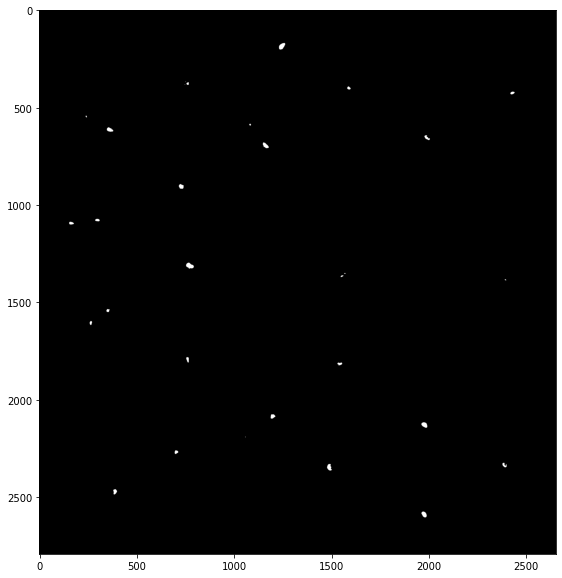

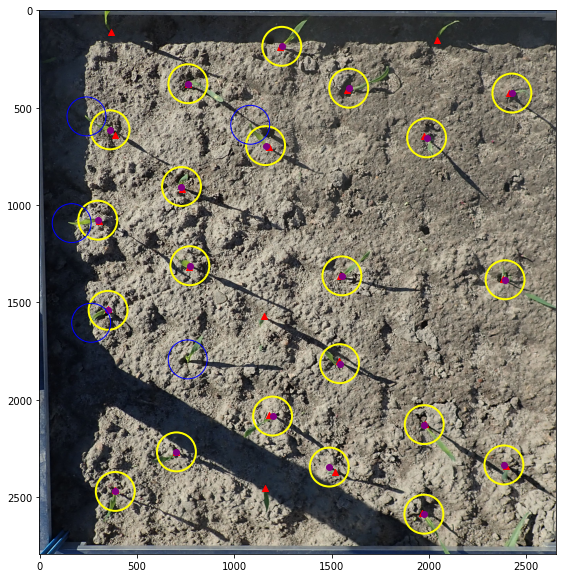

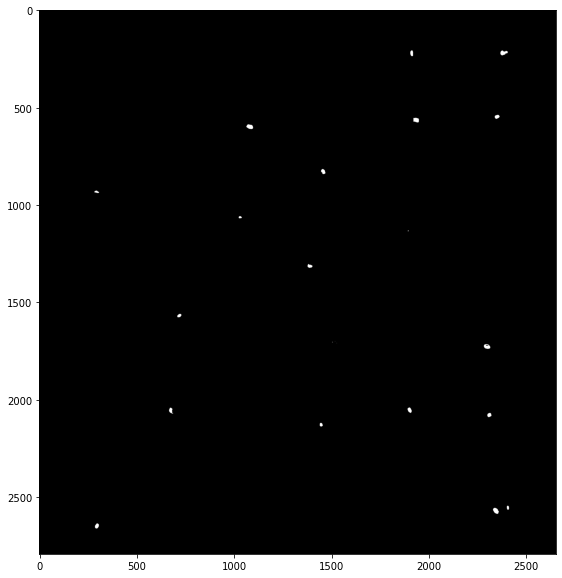

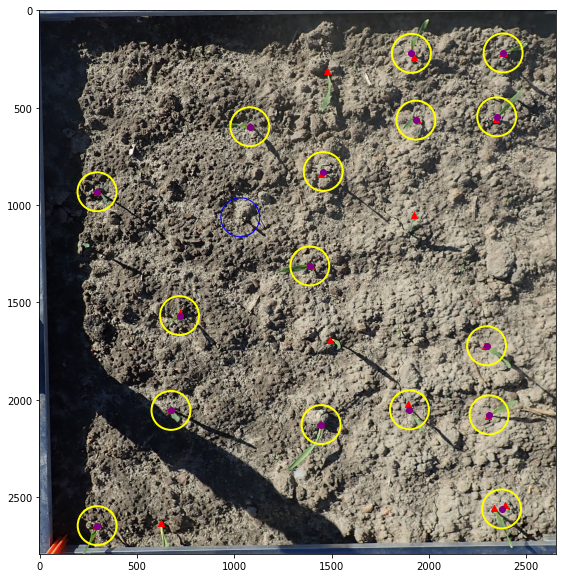

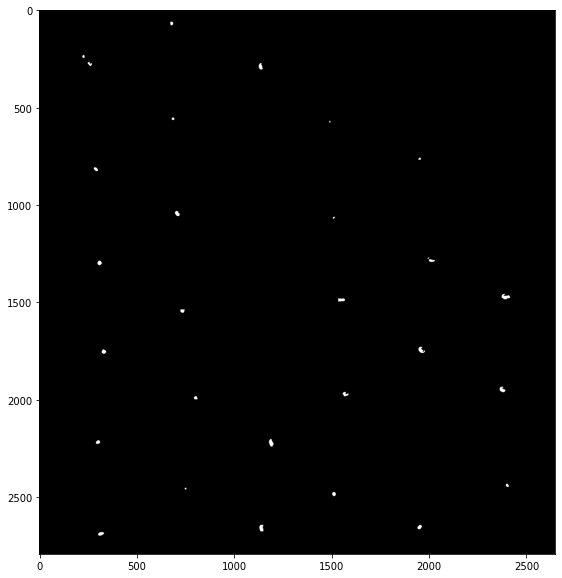

...

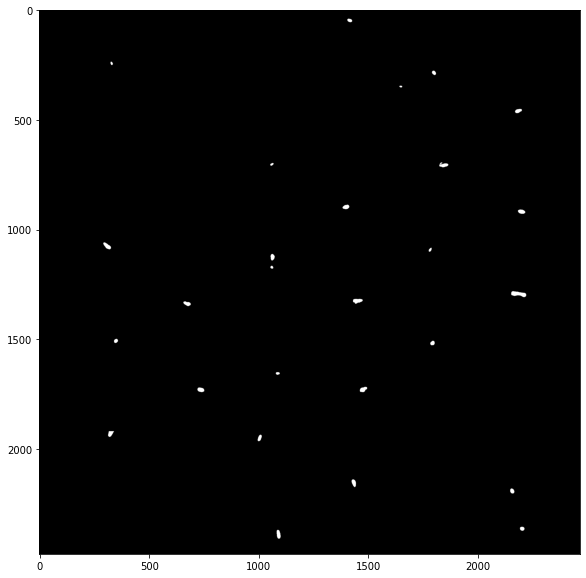

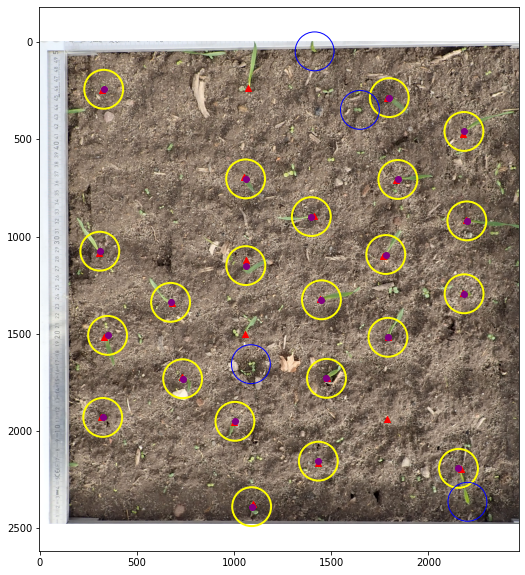

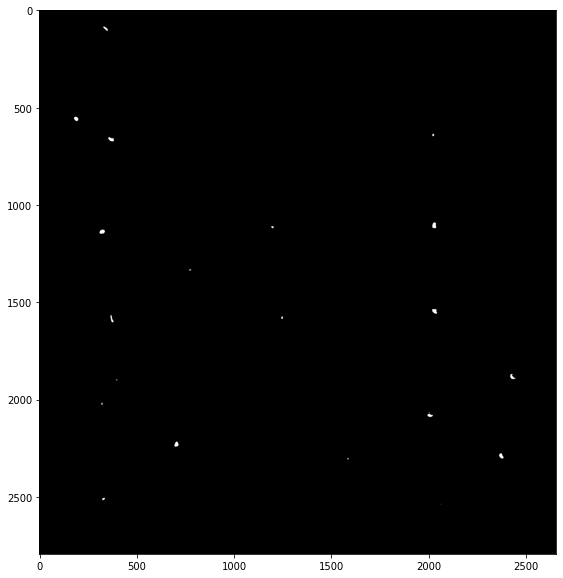

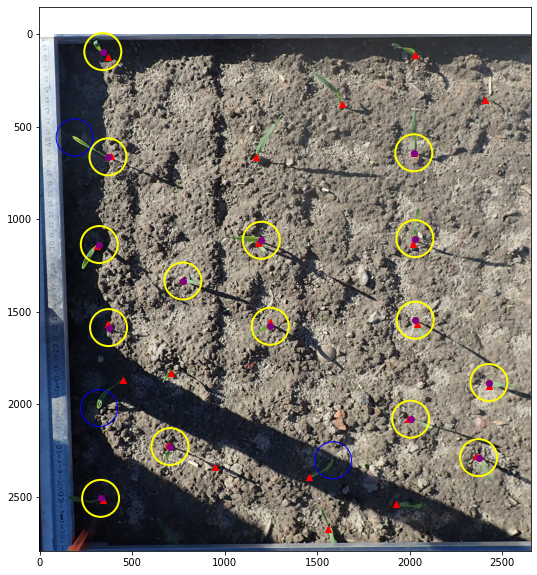

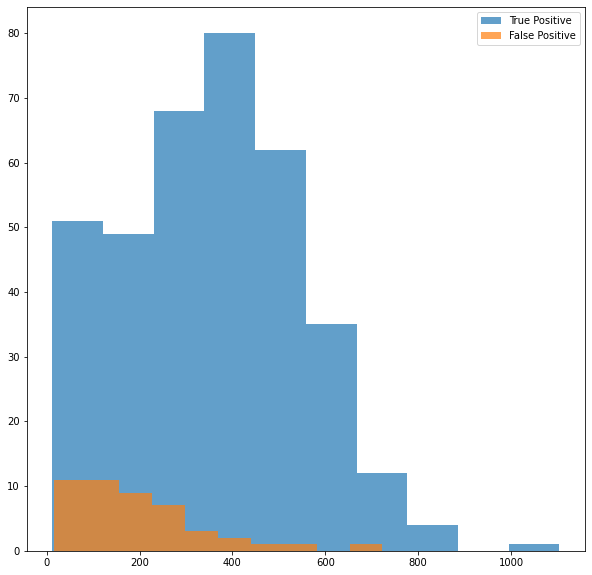

In [8]:
import seaborn as sns
sum_uncorrect = 0
sum_correct = 0
correct_points_countours = []
uncorrect_points_countours = []
nb_correct_points = []
nb_uncorrect_points = []
nb_all_points = 0
all_tp_dists = []
all_fp_dists = []

# for i, name in enumerate(names[:1]):
for i, name in enumerate(names):
  # if ( i == 0):
    uncorrect = 0
    # print(sns.heatmap(outputs[i][0]))
    # outputs[i] = torch.sigmoid(output[i]) > 0.35
    predict = outputs[i][0].numpy().astype(np.uint8)
    plt.figure(figsize = (10,10))
    plt.imshow(predict, cmap='gray')
    plt.show()
    contours, _ = cv2.findContours(predict.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_TC89_L1)
    centres = {}
    for i in range(len(contours)):
      moments = cv2.moments(contours[i])
      if (cv2.contourArea(contours[i]) > 10 and cv2.contourArea(contours[i]) < 20000):
        point_position = (int(moments['m10']/(moments['m00']+1e-6)), int(moments['m01']/(moments['m00']+1e-6)))
        point_countour = cv2.contourArea(contours[i])
        centres[point_position] = point_countour
    centres_list = list(centres.keys())
    plt.figure(figsize=(10, 10))
    currentAxis = plt.gca()

    x_predicted = [point[0] for point in centres]
    y_predicted = [point[1] for point in centres]
    
    points = [[x_temp, y_temp] for x_temp, y_temp in zip(x_predicted, y_predicted)]

    radius = 100

    composed_points = {}
    composed_points_indexes = []
    for i in range(len(centres_list)):
      point = centres_list[i]
      nb_points = 1
      found = False
      composed_point = list(point).copy()
      sum_countours = centres[point]
      for j in range(i+1, len(centres_list)):      
        if j not in composed_points_indexes:
          if ((centres_list[j][0] - point[0])**2 + (centres_list[j][1] - point[1])**2 < radius**2):
            found = True
            nb_points += 1
            composed_point[0] += centres_list[j][0]
            composed_point[1] += centres_list[j][1]
            sum_countours += centres[centres_list[j]]
            composed_points_indexes.append(i)
            composed_points_indexes.append(j)
      if (found):
        x_value = composed_point[0] // nb_points
        y_value = composed_point[1] // nb_points
        composed_points[(x_value, y_value)] = sum_countours // nb_points
      else:
        if i not in composed_points_indexes:
          composed_points[point] = centres[point]

    correct_predicted = {}

    x, y = target[name][0], target[name][1]
    corner_points  = target[name][5]
    x = [ number - corner_points[0] for number in x]
    y = [(number * -1) - (corner_points[1]*-1) for number in y]

    counter_predicted = 0
    

    for j in range(len(x)):
      found = False
      points_detected = 0
      for point in list(composed_points.keys()):
        condition = ( (point[0] - x[j])**2 + (point[1] - y[j])**2 <= radius**2)
        if (condition):
          found = True
          points_detected += 1
          correct_predicted[point] = composed_points[point]
      per_point_detected.append(points_detected)
      if (found):
        counter_predicted += 1


    uncorrect_predicted = composed_points.copy()

    for correct_point in list(correct_predicted.keys()):
      uncorrect_predicted.pop(correct_point)


    for value in list(correct_predicted.values()):
      correct_points_countours.append(value)
    for value in list(uncorrect_predicted.values()):
      uncorrect_points_countours.append(value)
    
    percent = counter_predicted / len(x)
    percents.append(percent*100)

    # uncorrect = len(x_uncorrect_predicted)
    image = Image.open(path_root_dir + name)
    image = TF.to_tensor(image)
    image = image[:,corner_points[1]*-1:corner_points[3]*-1,corner_points[0]:corner_points[2]]

    # plt.figure(figsize=(20, 20))
    ############
    plt.imshow(image.permute(1,2,0))
    plt.scatter(x = x, y = y, marker ='^', color='r')
    ##############
    # plt.scatter(x = x_uncorrect_predicted, y = y_uncorrect_predicted, marker ='^', color='b', alpha = 0.2)
    
    x_correct_predicted = [point[0] for point in list(correct_predicted.keys())]
    y_correct_predicted = [point[1] for point in list(correct_predicted.keys())]

    nb_correct_points.append(len(x_correct_predicted))

    plt.scatter(x = x_correct_predicted, y = y_correct_predicted, marker ='o', color='purple')

    x_uncorrect_predicted = [point[0] for point in list(uncorrect_predicted.keys())]
    y_uncorrect_predicted = [point[1] for point in list(uncorrect_predicted.keys())]
    
    nb_uncorrect_points.append(len(x_uncorrect_predicted))

    nb_all_points += len(x)

    for x_temp, y_temp in zip(x_correct_predicted,y_correct_predicted):
      currentAxis.add_patch(Circle((x_temp,y_temp), radius,color = 'yellow', linewidth = 2, alpha=1, fill = None))
    for x_temp, y_temp in zip(x_uncorrect_predicted,y_uncorrect_predicted):
      currentAxis.add_patch(Circle((x_temp,y_temp),radius,color = 'blue', linewidth = 1, alpha=1, fill = None))
    
    # plt.savefig('/content/drive/MyDrive/Bachelor/prediction_248_035/' + name[:-4] +'.png', dpi = 300)
    # plt.savefig('/content/annotated.png',dpi=300)
    plt.show()

    tp = list(zip(x_correct_predicted, y_correct_predicted))
    fp = list(zip(x_uncorrect_predicted, y_uncorrect_predicted))
    tp_dists, fp_dists = euclid_distances(targets = list(zip(x,y)), tp = tp, fp = fp)

    all_tp_dists.append(tp_dists)
    all_fp_dists.append(fp_dists)

plt.figure(figsize=(10, 10))
plt.hist(correct_points_countours, alpha = 0.7, label = 'True Positive')
plt.hist(uncorrect_points_countours, alpha = 0.7, label='False Positive')
plt.legend()
plt.show()



In [9]:
absolut_points_found = sum(nb_correct_points)
uncorrects = sum(nb_uncorrect_points)
precision = absolut_points_found / (absolut_points_found + uncorrects)
recall = absolut_points_found / nb_all_points
f1 = 2 * precision * recall / (precision + recall)
print(f'f1: {f1}, precision: {precision}, recall: {recall}')

f1: 0.8527679623085983, precision: 0.8872549019607843, recall: 0.8208616780045351


In [10]:
test_tp_dists = flatten(all_tp_dists)
test_fp_dists = flatten(all_fp_dists)

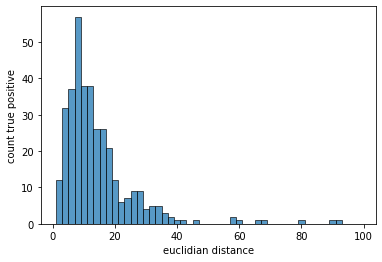

In [11]:
plt.xlabel('euclidean distance')
plt.ylabel('count true positive')
plt.show(sns.histplot(test_tp_dists, bins=range(1, 100, 2)))

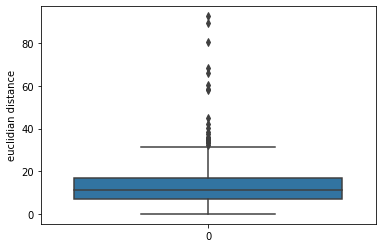

In [12]:
plt.xlabel('')
plt.ylabel('euclidean distance')
plt.show(sns.boxplot(data = test_tp_dists))

In [13]:
nb_all_points

441